In [1]:
%matplotlib inline
import io

import cv2
import numpy as np
import PIL.Image

from matplotlib import pyplot as plt
from IPython.display import Image, display

from transform.purifier import ImagesPurifier
from transform.weights import create_image_histogram

In [2]:
titles = [f"d00{i+1}.jpg" for i in range(5)]
images = [cv2.imread(f"data/{title}") for title in titles]

# images = [cv2.imread(f"data_2/{title}") for title in titles]
result = cv2.imread(f"data/result.png")

def showarray(img, converted: int | None = cv2.COLOR_BGR2RGB) -> None:
    if converted is not None:
        img = cv2.cvtColor(img, converted)
    f = io.BytesIO()
    PIL.Image.fromarray(np.clip(img.astype(np.uint8), 0, 255)).save(f, "png")
    display(Image(data=f.getvalue()))

def show_image_color_density_plot(image: np.ndarray) -> None:
    histograms = create_image_histogram(image).T
    densities = histograms / np.repeat(np.sum(histograms, axis=1), 256).reshape(3, 256)

    plt.plot(densities[0], color="blue")
    plt.plot(densities[1], color="green")
    plt.plot(densities[2], color="red")
    plt.show()


c:\Users\sbart\OneDrive - put.poznan.pl\Semestr V\Computer Vision\Project 1\transform\weights.py:91: RuntimeWarning: invalid value encountered in true_divide
  weights_norm = weights_stacked / np.atleast_3d(np.sum(weights_stacked, axis=2))


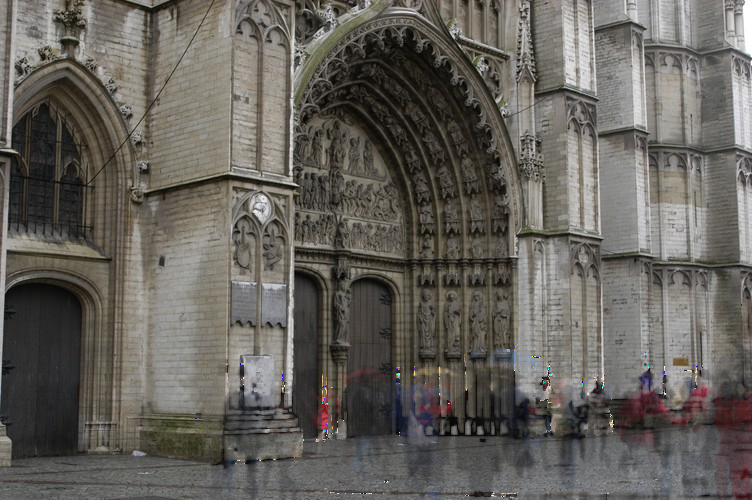

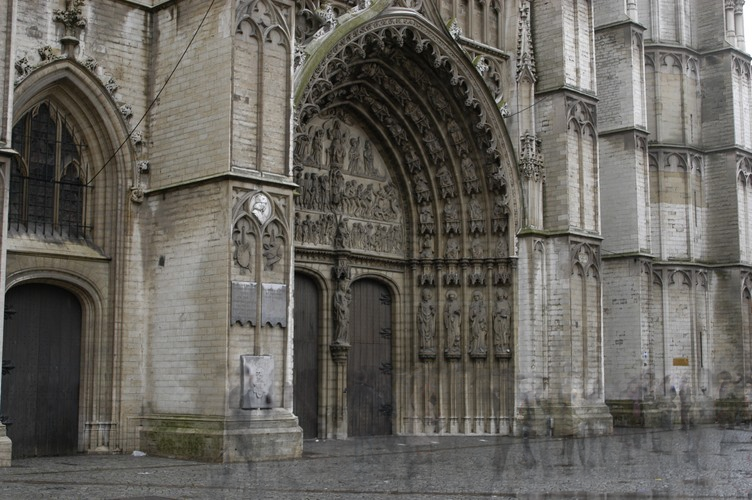

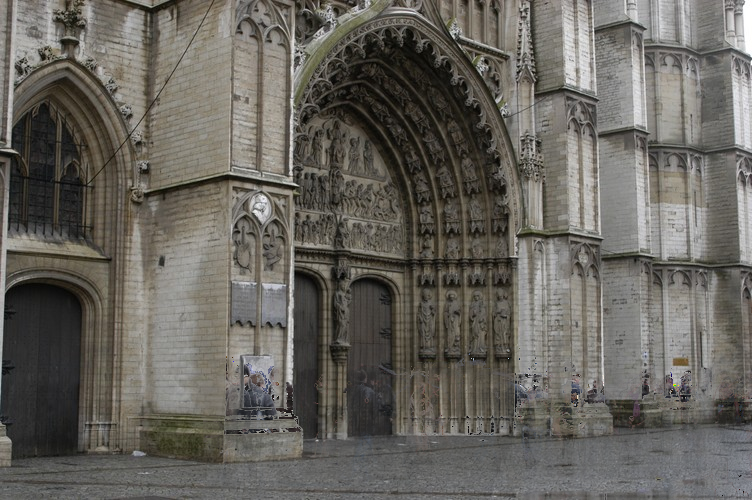

In [4]:
purifier = ImagesPurifier(images, use_max_merge=False)
showarray(purifier.purify_with_edge_weight())
showarray(purifier.purify_with_mean_pixel_distance_and_channel_intensity())
showarray(purifier.purify_with_pixel_probability())

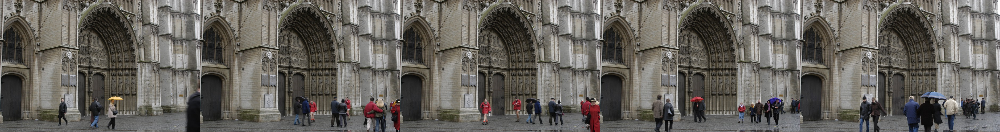

In [4]:
showarray(np.concatenate(images, axis=1))

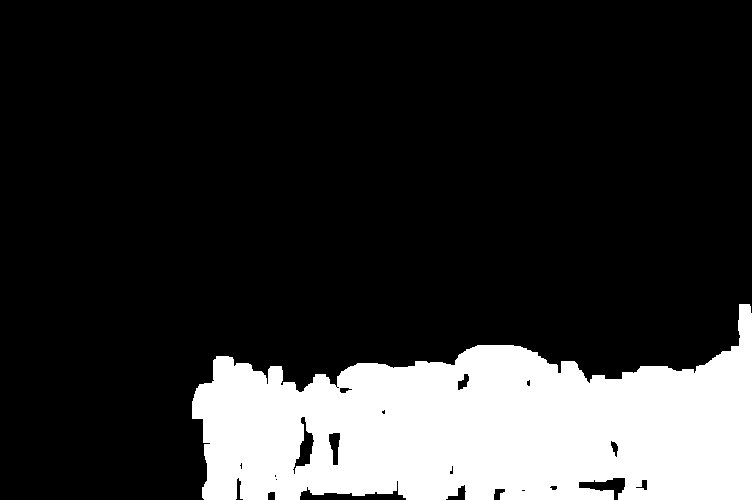

In [6]:
changing_mask = it.extract_common_region(images, 15, erosions=3, dilations=5)
showarray(changing_mask*255)

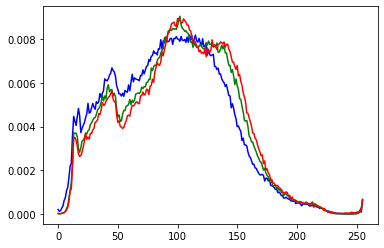

In [7]:
show_image_color_density_plot(images[0])

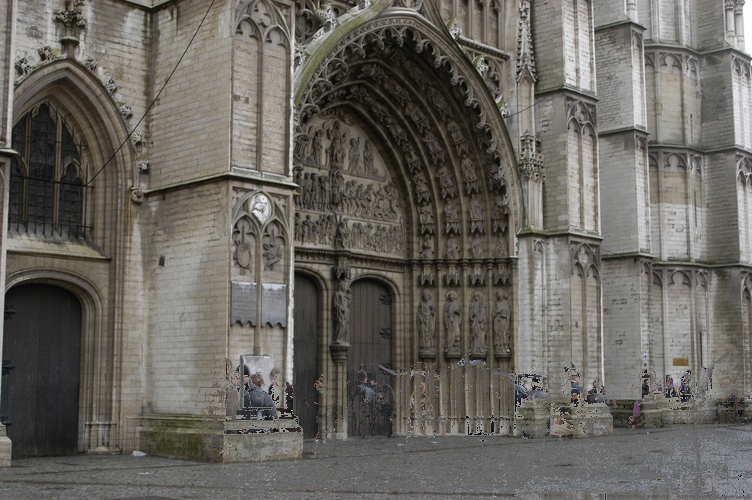

In [8]:

merged_1 = it.extract_pure_image_with_probabilities(images, changing_mask)
showarray(merged_1)

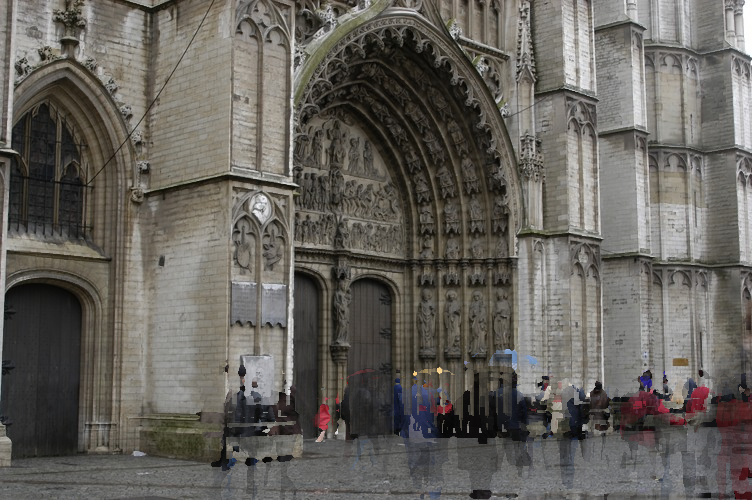

In [11]:
edge_weigths = [it.get_inverse_edge_weight(image) for image in images]
edged_merged = it.merge_use_max(images, edge_weigths)
showarray(edged_merged)

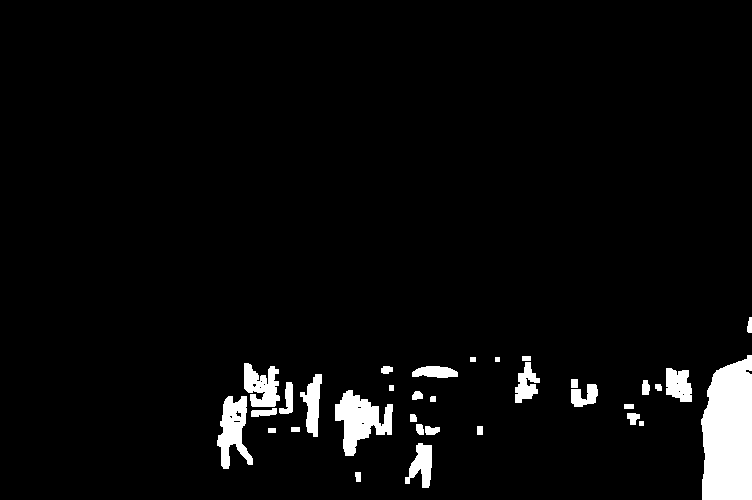

In [31]:
mean_pixel = np.mean(images, axis=(0, 1, 2)).astype(np.uint8)
distance_mask = it.get_distance_mask(images[0], changing_mask, [mean_pixel], [0.3])

showarray(distance_mask*255, None)

In [40]:
bm = it.get_overly_blue_mask(images[0], 0.5)
rm = it.get_overly_red_mask(images[0], 0.5)

np.logical_and(bm, rm, bm).shape

(500, 752)

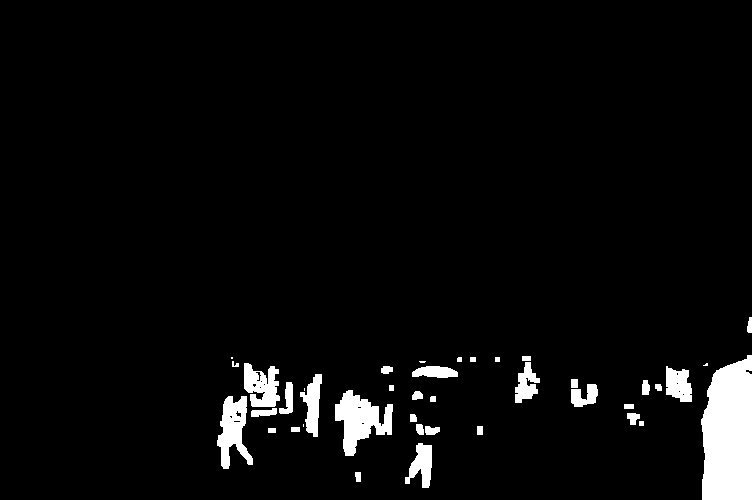

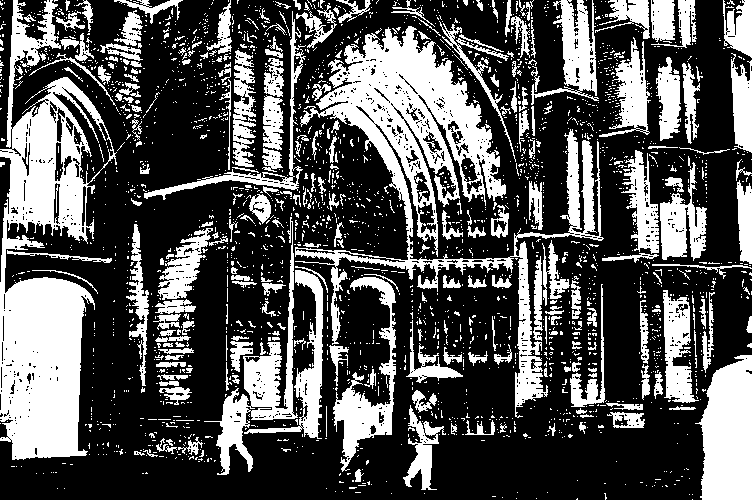

In [30]:
masks = [
    it.get_distance_to_vector(images[0], pixel) > threshold
    for pixel, threshold in zip([mean_pixel], [0.3])
]
grayscaled = cv2.erode(masks[0].astype(np.uint8), np.ones((3, 3), np.uint8), iterations=2)
grayscaled = cv2.dilate(grayscaled, np.ones((3, 3), np.uint8), iterations=2)
grayscaled[changing_mask == 0] = 0
showarray((grayscaled > 0) * 255, None)
showarray(masks[0] * 255, None)

In [ ]:
masks[0][changing_mask == 0]

In [12]:
purified_image = it.get_pure_image(images, [mean_pixel], [0.4])
showarray(purified_image)

TypeError: get_high_single_channel_intensity_mask() takes 2 positional arguments but 3 were given

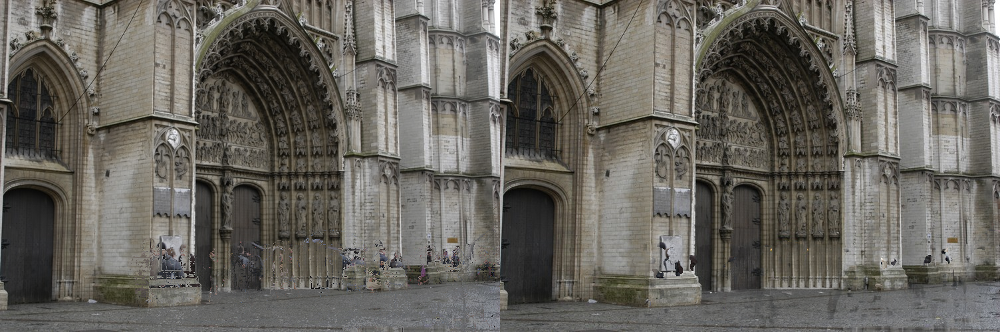

In [10]:
merged_images = [merged_1, purified_image]
showarray(np.concatenate(merged_images, axis=1))

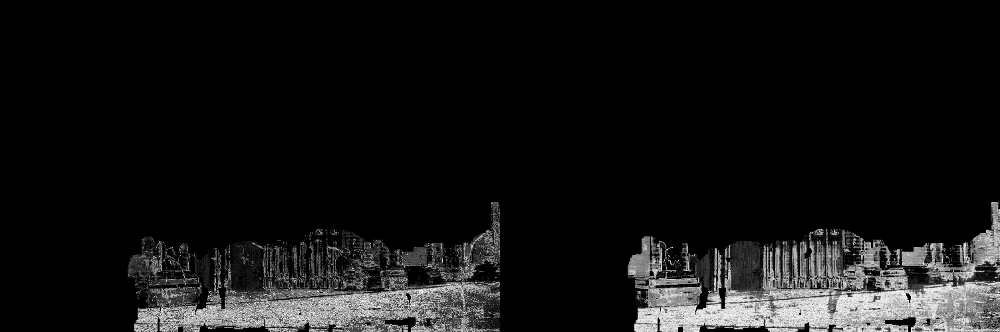

In [11]:
weights = [it.get_pixel_probabilities(image) for image in merged_images]
for weight, image in zip(weights, merged_images):
    weight[:] = np.clip(weight - it.get_std_mask(image), 0, 1) 
    weight[changing_mask == 0] = 0

showarray(np.concatenate(weights, axis=1) * 255, None)
supreme_merged = it.merge_use_max(merged_images, weights)

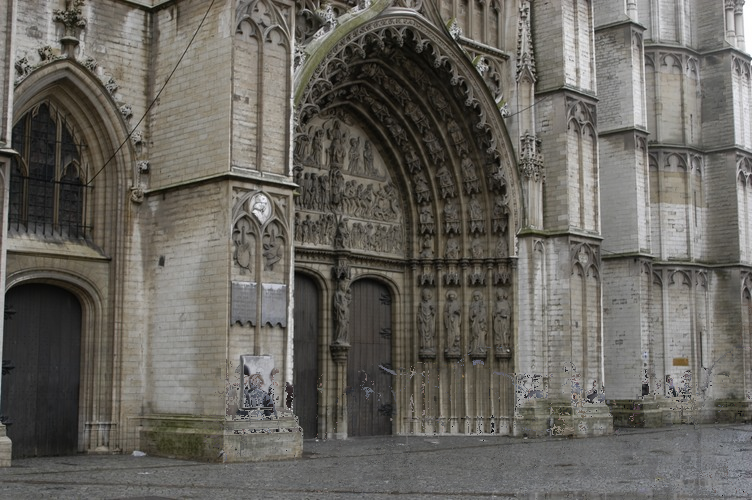

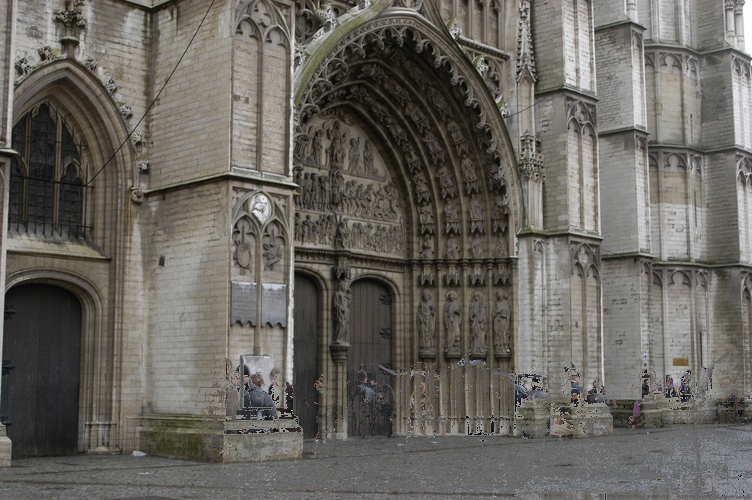

In [12]:
showarray(supreme_merged)
showarray(merged_1)

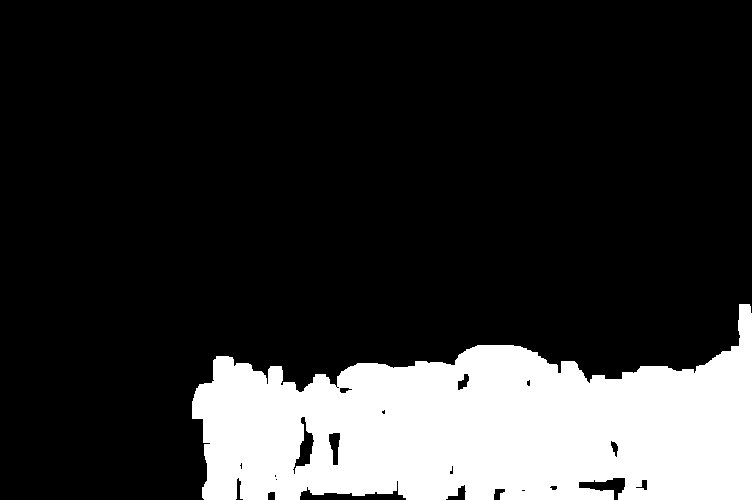

In [4]:
changing_mask = it.extract_common_region(images, 15, erosions=3, dilations=5)
showarray(changing_mask*255)